In [1]:
#!/usr/bin/env python
# -*- coding: utf-8 -*-
# ***********************************
# Version: 0.1.1                    #
# Author:  rongboshen               #
# Email:   rongboshen2019@gmail.com #
# Date:    2023.10.24               #
# ***********************************

import os
import numpy as np
import pandas as pd
import argparse
import matplotlib.pyplot as plt
import seaborn as sns
import scanpy as sc
import math
import warnings
import json
import anndata as ad
from sklearn.metrics import confusion_matrix, accuracy_score, f1_score
warnings.filterwarnings("ignore")

In [2]:
def horizontal(array, height=0):
    horizonx = array[:,0]
    horizony = height - array[:,1]
    return np.stack((horizonx, horizony),axis=1)

def verizontal(array, width=0):
    verizonx = width - array[:,0]
    verizony = array[:,1]
    return np.stack((verizonx, verizony),axis=1)

def rotate(array, angle):
    rotatex = math.cos(angle)*array[:,0] - math.sin(angle)*array[:,1]
    rotatey = math.cos(angle)*array[:,1] + math.sin(angle)*array[:,0]
    return np.stack((rotatex, rotatey),axis=1)

def alignment(array):
    minx, miny, maxx, maxy = np.min(array[:,0]), np.max(array[:,0]), np.min(array[:,1]), np.max(array[:,1])
    return array - np.array([minx, miny]), maxx-minx, maxy-miny


def reorder(adata, subname):
    nindex = np.argsort(adata.obs[subname])[::-1]
    adata_reorder = adata[nindex,:]
    return adata_reorder


def draw_umap(adata, save_dir, ext, annot, color_pal, pca=False, normal=True):
    plt.style.use('seaborn-white') 
    sc.settings.figdir = save_dir
    if normal:
        sc.pp.normalize_total(adata, inplace=True)
        sc.pp.log1p(adata)

    if pca:
        sc.pp.pca(adata, n_comps=50)
        sc.pp.neighbors(adata)
    else:
        sc.pp.neighbors(adata, use_rep='X')

    sc.tl.umap(adata)
    sc.pl.umap(adata, color=annot, palette=color_pal, legend_fontsize='large')

def draw_matrix_map(matrix, save_dir, name, label_x, label_y):

    sns.set(font_scale=1)
    fig, ax = plt.subplots(figsize=(16,16))
    ax = sns.heatmap(matrix, ax=ax, cbar=False, annot=True, fmt='d', cmap='Blues', square=True, xticklabels=label_x, yticklabels=label_y)
    fig.savefig(os.path.join(save_dir, '%s.pdf'%name), bbox_inches='tight')
    plt.close()

    map_sum = np.sum(matrix, axis=1)
    percent_matrix = np.divide(matrix.T, map_sum).T
    fig, ax = plt.subplots(figsize=(16,16))
    ax = sns.heatmap(percent_matrix, ax=ax, cbar=True, cbar_kws={'shrink':0.75}, annot=False, cmap='Reds', square=True, xticklabels=label_x, yticklabels=label_y)
    ax.tick_params(labelsize=20)
    plt.yticks(rotation=0)
    plt.xticks(rotation=45, ha='right')
    plt.xlabel('Predict Label', fontsize=30)
    plt.ylabel('True Label', fontsize=30)
    fig.savefig(os.path.join(save_dir, 'percent_%s.pdf'%name), bbox_inches='tight')
    plt.close()

    return 0

def draw_axs_spatial_types(ax, cell_labels, x_locs, y_locs, method, ms, dataset, legend, ctype_pal, markerscale):

    ax.set_aspect(1)

    cell_types = set(cell_labels)
    tmp = list(zip(cell_labels,x_locs,y_locs))

    for cell_t in cell_types:
        sub_tmp = [i for i in tmp if i[0]==cell_t]
        sub_cell_labels, sub_x_locs, sub_y_locs = list(zip(*sub_tmp))
        ax.scatter(x=sub_x_locs, y=sub_y_locs, s=ms, c=ctype_pal[cell_t], edgecolors='none', label=cell_t)
    ax.scatter(x=[], y=[], s=ms, c=ctype_pal['unassigned'], edgecolors='none', label='unassigned')

    for sp in ax.spines.values():
        sp.set_visible(False)

    ax.set_xticks([])
    ax.set_yticks([])
    if legend: ax.legend(bbox_to_anchor=(0,-0.02),loc='upper left', ncols=12, fontsize=20, borderaxespad=0, markerscale=markerscale, edgecolor='white')
    if dataset: ax.set_ylabel(dataset, fontsize=25, labelpad=10)
    if method: ax.set_title(method, fontsize=25, pad=10)


def draw_spatial_hpr(sub_save_dir, st_adata, all_methods, color_dict):
  
    # For hpr dataset, draw spatial demo slice for different methods. -- sample1
    demo_save_dir = os.path.join(sub_save_dir, 'visual')
    if not os.path.exists(demo_save_dir): os.makedirs(demo_save_dir)
    sc.settings.figdir = demo_save_dir
    print('Write demo slice for different methods. -- sample1')

    demo_df = pd.DataFrame(st_adata.obsm['spatial'], index=st_adata.obs.index.to_list(), columns=['x','y', 'z'])
    demo_df = pd.concat([demo_df, st_adata.obs[all_methods]],axis=1)
    demo_df.to_csv(os.path.join(demo_save_dir, 'sample1_all.csv')) # restore the predictions of all methods for 3D figure. Fig S


    # obsolete
    # slice == -0.29
    first_slice_acc = {}
    sub_smaple_adata = st_adata[st_adata.obs.Bregma==-0.29, :]
    first_label_true = sub_smaple_adata.obs['Ground Truth'].to_list()

    sub_smaple_adata.obsm['spatial'] = sub_smaple_adata.obsm['spatial'][:,:-1]
    coords = sub_smaple_adata.obsm['spatial']
    _coords, _, _ =  alignment(coords)
    sub_smaple_adata.obsm['spatial'] ,_ ,_ = alignment(verizontal(horizontal(_coords)))
    for method in all_methods:
        #sc.pl.spatial(sub_smaple_adata, img_key=None, color=method, palette=color_dict, spot_size=15, legend_fontsize='x-small', save="_%s.pdf"%method)
        _pred = sub_smaple_adata.obs[method].to_list()
        acc = np.sum(np.array(first_label_true) == np.array(_pred)) *1.0 / len(_pred)
        first_slice_acc[method] = acc
    print('===> Acc on slice -0.29:', first_slice_acc)


    # slice == -0.14
    second_slice_acc = {}
    sub_smaple_adata2 = st_adata[st_adata.obs.Bregma==-0.14, :]
    second_label_true = sub_smaple_adata2.obs['Ground Truth'].to_list()

    sub_smaple_adata2.obsm['spatial'] = sub_smaple_adata2.obsm['spatial'][:,:-1]
    coords = sub_smaple_adata2.obsm['spatial']
    _coords, _, _ =  alignment(coords)
    sub_smaple_adata2.obsm['spatial'] ,_ ,_ = alignment(verizontal(horizontal(_coords)))
    for method in all_methods:
        #sc.pl.spatial(sub_smaple_adata2, img_key=None, color=method, palette=color_dict, spot_size=15, legend_fontsize='x-small', save="_%s_4.pdf"%method)
        _pred = sub_smaple_adata2.obs[method].to_list()
        acc = np.sum(np.array(second_label_true) == np.array(_pred)) *1.0 / len(_pred)
        second_slice_acc[method] = acc
    print('===> Acc on slice -0.14 for Fig3A:', second_slice_acc) # ACC for this demo slice, Fig 3A

    # Demo slice -0.14 for Fig3A
    ## slice == -0.14 merged figures 
    print('==> Demo slice for Fig3A')
    plt.style.use('seaborn-white')  
    fig, axs = plt.subplots(1, len(all_methods)+1, figsize=(40,10), gridspec_kw={'hspace':0, 'wspace':0.1})
    x_locs, y_locs = _coords[:,0], _coords[:,1]

    draw_axs_spatial_types(axs[0], sub_smaple_adata2.obs['Ground Truth'], x_locs, y_locs, 'Ground Truth', 4, 'HPR', True, color_dict, 8)
    for i, method in enumerate(all_methods):
        draw_axs_spatial_types(axs[i+1], sub_smaple_adata2.obs[method], x_locs, y_locs, method, 4, None, None, color_dict, 8)

    fig.savefig(os.path.join(demo_save_dir, 'hpr_demo.pdf'), bbox_inches='tight', dpi=100)
    plt.show()
    plt.close()



def robustness_test(sub_data_dir, sub_save_dir, label_true, cell_labels):
    # SpaGDA robustness test for spatial information embedding.
    # neighbor cells, [5,10,15,20,25,30,35,40]
    # data files for neighbor cells
    nc_files = ['best_dagcn_prediction_2022-10-13-22-22-46.csv',
                'best_dagcn_prediction_2022-10-13-23-32-56.csv',
                'best_dagcn_prediction_2022-10-14-01-28-21.csv',
                'best_dagcn_prediction_2022-10-14-04-24-59.csv',
                'best_results.csv',
                'best_dagcn_prediction_2022-10-14-14-24-27.csv',
                'best_dagcn_prediction_2022-10-14-19-29-38.csv',
                'best_dagcn_prediction_2022-10-15-01-57-02.csv']

    # sigma, [10,15,20,25,30,35,40,45,50,55,60,65,70]
    # data files for sigma
    sg_files = ['best_dagcn_prediction_2022-10-13-21-08-45.csv', 
                'best_dagcn_prediction_2022-10-13-18-40-28.csv', 
                'best_dagcn_prediction_2022-10-13-13-29-15.csv',
                'best_dagcn_prediction_2022-10-13-03-15-23.csv', 
                'best_dagcn_prediction_2022-10-12-23-46-03.csv', 
                'best_dagcn_prediction_2022-10-12-20-07-52.csv',
                'best_dagcn_prediction_2022-10-12-13-07-50.csv', 
                'best_results.csv', 
                'best_dagcn_prediction_2022-10-12-04-25-46.csv', 
                'best_dagcn_prediction_2022-10-10-20-54-42.csv',
                'best_dagcn_prediction_2022-10-11-01-26-31.csv', 
                'best_dagcn_prediction_2022-10-11-05-21-01.csv', 
                'best_dagcn_prediction_2022-10-11-13-11-07.csv']

    nc_acc = []
    nc_wf1 = []
    for ncf in nc_files:
        ncf_df = pd.read_csv(os.path.join(sub_data_dir, 'Results', ncf), index_col=0)
        ncf_df.rename(columns = {'Immature oligodendrocyte': 'Immature OD', 'Mature oligodendrocyte': 'Mature OD'}, inplace = True)
        SpaGDA_labels = ncf_df.columns.to_list()
        ncf_preds = [SpaGDA_labels[i] for i in np.argmax(ncf_df.to_numpy(), axis=1)]
        acc = np.sum(np.array(label_true) == np.array(ncf_preds)) *1.0 / len(ncf_preds)
        wf1 = f1_score(np.array(label_true), np.array(ncf_preds), average='weighted', labels=cell_labels)
        nc_acc.append(acc)
        nc_wf1.append(wf1)
    print("===> nc_acc, for Fig3G:",nc_acc)
    print("nc_wf1:",nc_wf1)

    sg_acc = []
    sg_wf1 = []
    for sgf in sg_files:
        sgf_df = pd.read_csv(os.path.join(sub_data_dir, 'Results', sgf), index_col=0)
        sgf_df.rename(columns = {'Immature oligodendrocyte': 'Immature OD', 'Mature oligodendrocyte': 'Mature OD'}, inplace = True)
        SpaGDA_labels = sgf_df.columns.to_list()
        sgf_preds = [SpaGDA_labels[i] for i in np.argmax(sgf_df.to_numpy(), axis=1)]
        acc = np.sum(np.array(label_true) == np.array(sgf_preds)) *1.0 / len(sgf_preds)
        wf1 = f1_score(np.array(label_true), np.array(sgf_preds), average='weighted', labels=cell_labels)
        sg_acc.append(acc)
        sg_wf1.append(wf1)
    print("===> sg_acc, for Fig3H:",sg_acc)
    print("sg_wf1:",sg_wf1)

    acc_neighbor_cells = [round(i*100,2) for i in nc_acc] #[87.58, 84.55, 88.20, 87.03, 90.06, 89.23, 88.45, 87.86]
    wf1_neighbor_cells = [round(i,4) for i in nc_wf1]
    neighbor_number = [5,10,15,20,25,30,35,40]
    acc_sigma = [round(i*100,2) for i in sg_acc] #[87.88, 86.91, 87.18, 86.87, 86.94, 89.21, 89.01, 90.06, 89.79, 88.79, 89.02, 88.64, 89.41]
    wf1_sigma = [round(i,4) for i in sg_wf1]
    sigma = [10,15,20,25,30,35,40,45,50,55,60,65,70]

    # Accuracy curve, neighbor cells, Fig3G
    plt.style.use('seaborn-white')  
    fig, ax = plt.subplots(figsize=(10,8))
    ax.spines[['top', 'right']].set_visible(False)
    ax.spines[['bottom','left']].set_linewidth(4)
    ax.plot(neighbor_number, acc_neighbor_cells, color = 'black', linewidth=4, linestyle='--')
    ax.scatter(25,acc_neighbor_cells[4], s=200, c='red', marker='o')
    ax.text(25,acc_neighbor_cells[4]+0.5,
             acc_neighbor_cells[4],
             ha='center', 
             va='bottom', fontsize=30
            )
    ax.tick_params(axis='x', labelsize=30, pad=15)
    ax.tick_params(axis='y', labelsize=30)
    ax.set_title('Accuracy (Unit: %)', fontsize=40) 
    ax.set_xlabel('Neighbor cells',fontsize=30)
    ax.set_xticks(neighbor_number, neighbor_number)
    ax.set_ylim(80, 100)
    fig.savefig(os.path.join(sub_save_dir, 'curve_neighbor_accuracy.pdf'), bbox_inches='tight')
    plt.show()
    plt.close()

    # Weighted F1 score cure, neighbor cells, obsoleted
    plt.style.use('seaborn-white')  
    fig, ax = plt.subplots(figsize=(10,8))
    ax.spines[['top', 'right']].set_visible(False)
    ax.spines[['bottom','left']].set_linewidth(4)
    ax.plot(neighbor_number, wf1_neighbor_cells, color = 'black', linewidth=4, linestyle='--')
    ax.scatter(25,wf1_neighbor_cells[4], s=200, c='red', marker='o')
    ax.text(25,wf1_neighbor_cells[4]+0.01,
             wf1_neighbor_cells[4],
             ha='center', 
             va='bottom', fontsize=30
            )
    ax.tick_params(axis='x', labelsize=30, pad=15)
    ax.tick_params(axis='y', labelsize=30)
    ax.set_title('F1 score', fontsize=40) 
    ax.set_xlabel('Neighbor cells',fontsize=30)
    ax.set_xticks(neighbor_number, neighbor_number)
    ax.set_ylim(0.8, 1)
    fig.savefig(os.path.join(sub_save_dir, 'curve_neighbor_f1.pdf'), bbox_inches='tight')
    plt.show()
    plt.close()    

    # Accuracy curve, theta, Fig3H
    plt.style.use('seaborn-white')  
    fig, ax = plt.subplots(figsize=(10,8))
    ax.spines[['top', 'right']].set_visible(False)
    ax.spines[['bottom','left']].set_linewidth(4)
    ax.plot(sigma, acc_sigma, color = 'black', linewidth=4, linestyle='--')
    ax.scatter(45,acc_sigma[7], s=200, c='red', marker='o')
    ax.text(45,acc_sigma[7]+0.5,
             acc_sigma[7],
             ha='center', 
             va='bottom', fontsize=30
            )
    ax.tick_params(axis='x', labelsize=30, pad=15)
    ax.tick_params(axis='y', labelsize=30)
    ax.set_title('Accuracy (Unit: %)', fontsize=40) 
    ax.set_xlabel('Theta',fontsize=30)
    ax.set_xticks(sigma, sigma)
    ax.set_ylim(80, 100)
    fig.savefig(os.path.join(sub_save_dir, 'curve_sigma_accuracy.pdf'), bbox_inches='tight')
    plt.show()
    plt.close()

    # Weighted F1 score cure, theta, obsoleted.
    plt.style.use('seaborn-white')  
    fig, ax = plt.subplots(figsize=(10,8))
    ax.spines[['top', 'right']].set_visible(False)
    ax.spines[['bottom','left']].set_linewidth(4)
    ax.plot(sigma, wf1_sigma, color = 'black', linewidth=4, linestyle='--')
    ax.scatter(45,wf1_sigma[7], s=200, c='red', marker='o')
    ax.text(45,wf1_sigma[7]+0.01,
             wf1_sigma[7],
             ha='center', 
             va='bottom', fontsize=30
            )
    ax.tick_params(axis='x', labelsize=30, pad=15)
    ax.tick_params(axis='y', labelsize=30)
    ax.set_title('F1 score', fontsize=40) 
    ax.set_xlabel('Theta',fontsize=30)
    ax.set_xticks(sigma, sigma)
    ax.set_ylim(0.8, 1)
    fig.savefig(os.path.join(sub_save_dir, 'curve_sigma_f1.pdf'), bbox_inches='tight')
    plt.show()
    plt.close()  


def draw_spatial_mop(sub_save_dir, st_adata, all_methods, color_dict):
  
    # For mop dataset, draw spatial demo slice for different methods. -- mouse1_sample3, 4 slices
    demo_save_dir = os.path.join(sub_save_dir, 'visual')
    if not os.path.exists(demo_save_dir): os.makedirs(demo_save_dir)
    ET_cell_types = ['L5 ET','L5/6 NP','L6 CT','L6b']

    # four slices
    slices = set(st_adata.obs.slice_id)
    for nslice in slices:
        slice_save_dir = os.path.join(demo_save_dir, nslice)
        sc.settings.figdir = slice_save_dir
        print('Write slice %s for different methods...'%nslice)
        sub_adata = st_adata[st_adata.obs.slice_id==nslice,:]

        # adjust coordinates
        coords = sub_adata.obsm['spatial']
        _coords, _, _ =  alignment(coords)
        if nslice == 'mouse1_slice153':
            sub_adata.obsm['spatial'] ,_ ,_ = alignment(horizontal(_coords))
        elif nslice =='mouse1_slice112':
            sub_adata.obsm['spatial'] ,_ ,_ = alignment(verizontal(_coords))
        else:
            sub_adata.obsm['spatial'] = _coords

        sub_adata.obs['ET'] = [i if i in ET_cell_types else 'other' for i in sub_adata.obs['Ground Truth']]
        #sc.pl.spatial(sub_adata, img_key=None, color='Ground Truth', palette=color_dict, spot_size=25, legend_fontsize='x-small', save="_GT.pdf") 
        #sc.pl.spatial(sub_adata, img_key=None, color='ET', palette=color_dict, spot_size=25, legend_fontsize='x-small', save="_ET.pdf")
        for method in all_methods:
            sub_adata.obs['ET %s'%method] = [i if i in ET_cell_types else 'other' for i in sub_adata.obs[method]]
            #sc.pl.spatial(sub_adata, img_key=None, color=method, palette=color_dict, spot_size=25, legend_fontsize='x-small', save="_%s.pdf"%method) 
            #sc.pl.spatial(reorder(sub_adata, 'ET %s'%method), img_key=None, color='ET %s'%method, palette=color_dict, spot_size=25, legend_fontsize='x-small', save="_ET_%s.pdf"%method)

        plt.style.use('seaborn-white')  
        fig, axs = plt.subplots(1, len(all_methods)+1, figsize=(40,10), gridspec_kw={'hspace':0, 'wspace':0.1})
        coords, _, _ = alignment(horizontal(sub_adata.obsm['spatial']))
        x_locs, y_locs = coords[:,0], coords[:,1]

        # draw all methods result, Fig S
        draw_axs_spatial_types(axs[0], sub_adata.obs['Ground Truth'], x_locs, y_locs, 'Ground Truth', 4, 'MOp '+nslice.split('_')[-1], True, color_dict, 8)
        for i, method in enumerate(all_methods):
            draw_axs_spatial_types(axs[i+1], sub_adata.obs[method], x_locs, y_locs, method, 4, None, None, color_dict, 8)

        fig.savefig(os.path.join(slice_save_dir, '%s.pdf'%nslice), bbox_inches='tight', dpi=100)
        plt.show()
        plt.close()

        # calculate acc for slice mouse1_slice153
        if nslice == 'mouse1_slice153':
            acc_dict = {}
            _sub_adata = sub_adata[~sub_adata.obs['Ground Truth'].isin(['L4/5 IT', 'L6 IT Car3']), :]
            true_label = _sub_adata.obs['Ground Truth'].tolist()
            for method in all_methods:
                _pred = _sub_adata.obs[method].to_list()
                acc = np.sum(np.array(true_label) == np.array(_pred)) *1.0 / len(_pred)
                acc_dict[method] = acc
            print('===> Acc on slice mouse1_slice153:', acc_dict)

def draw_spatial_testis(sub_save_dir, st_adata, all_methods, color_dict):
    # For testis dataset, draw spatial demo for different methods. --WT3

    demo_save_dir = os.path.join(sub_save_dir, 'visual')
    if not os.path.exists(demo_save_dir): os.makedirs(demo_save_dir)

    sc.settings.figdir = demo_save_dir
    print('Write demo for different methods.')

    #sc.pl.spatial(st_adata, img_key=None, color='Ground Truth', palette=color_dict, spot_size=15, legend_fontsize='x-small', save="_GT.pdf")
    #for method in all_methods:
        #sc.pl.spatial(st_adata, img_key=None, color=method, palette=color_dict, spot_size=15, legend_fontsize='x-small', save="_%s.pdf"%method)

    plt.style.use('seaborn-white')  
    fig, axs = plt.subplots(1, len(all_methods)+1, figsize=(40,10), gridspec_kw={'hspace':0, 'wspace':0.1})
    coords, _, _ = alignment(st_adata.obsm['spatial'])
    x_locs, y_locs = coords[:,0], coords[:,1]

    # draw all methods result, Fig S
    draw_axs_spatial_types(axs[0], st_adata.obs['Ground Truth'], x_locs, y_locs, 'Ground Truth', 0.5, 'Testis', True, color_dict, 20)
    for i, method in enumerate(all_methods):
        draw_axs_spatial_types(axs[i+1], st_adata.obs[method], x_locs, y_locs, method, 0.5, None, None, color_dict, 20)

    fig.savefig(os.path.join(demo_save_dir, 'testis.pdf'), bbox_inches='tight', dpi=100)
    plt.show()
    plt.close()

In [3]:
save_dir = '/data/bioinf/jyuan/rongboshen/SpaGDA/draw_fig3/'
data_dir = '/data/bioinf/jyuan/rongboshen/SpaGDA/results/annotation'
if not os.path.exists(save_dir): os.mkdir(save_dir)

# total of 3 dataset
datasets = ['Mop', 'Moffit', 'Sperm']
dataset_names = ['MOp','HPR','Testis']
dataset_color_pal = {'MOp':   '#46b2d3',
                     'HPR':   '#d36746',
                     'Testis':'#46d3ae'
}

# removed cell types in reference dataset.
sc_del_types = {'Mop': ['Prog/IP', 'CR'],
                'Moffit': ['Ambiguous', 'Fibroblast', 'Unstable', 'Macrophage','Newly formed oligodendrocyte'],
                'Sperm': ['InnateLymph', 'Unknown']
}

cell_types = {'Mop': ['L2/3 IT','L5 IT','L6 IT','L5 ET','L5/6 NP','L6 CT','L6b','Lamp5','Sncg','Vip','Sst','Pvalb','Peri','Endo','SMC','VLMC','Astro','Macrophage','OPC','Oligo'],
              'Moffit': ['Excitatory', 'Inhibitory', 'Immature OD', 'Mature OD', 'Microglia', 'Endothelial', 'Mural', 'Ependymal', 'Astrocytes' ],
              'Sperm': ['Macrophage', 'Endothelial', 'Myoid', 'Leydig', 'Sertoli', 'SPG', 'SPC', 'RS', 'ES']
}


cell_type_colors = {'Mop': {'L2/3 IT': 'green', 'L5 IT': 'purple', 'L6 IT': 'pink', 'L5 ET': 'violet', 'L5/6 NP': 'yellowgreen', 'L6 CT': 'peru', 'L6b': 'slateblue', 
                            'Lamp5': 'blue', 'Sncg': 'lavender', 'Vip': 'gold', 'Sst': 'red', 'Pvalb': 'indigo', 'Peri': 'linen', 'Endo': 'brown', 'SMC': 'thistle', 
                            'VLMC': 'orange', 'Astro': 'deepskyblue', 'Macrophage': 'lightcyan', 'OPC': 'lightgreen', 'Oligo': 'limegreen', 'L4/5 IT': 'darkcyan', 
                            'L6 IT Car3': 'skyblue', 'other': 'lightgray', 'unassigned': 'lightgray'},
                    'Moffit': {'Excitatory':'#0000ff', 'Inhibitory':'#ff00ff', 'Immature OD':'#ffff00', 'Mature OD': '#00ffff', 
                               'Microglia': '#a1a1ff', 'Endothelial':'#ff0000', 'Mural': '#ab8054', 'Ependymal':'#00ff00', 'Astrocytes':'#005500', 
                               'other': 'lightgray','unassigned': 'lightgray'},
                    'Sperm': {'Macrophage': 'lightcyan', 'Endothelial': 'brown', 'Myoid' : 'red', 'Leydig': 'gray', 'Sertoli': 'orange',  'SPG': 'skyblue', 
                              'SPC': 'purple', 'RS': 'darkcyan', 'ES': 'limegreen', 'unassigned': 'lightgray'}
}

# all methods
methods = ['cellidcell', 'scibet', 'scmapcell', 'scnymcpu', 'seurat', 'singler']
new_methods = ['tangram', 'cell2location']
method_names = {'cellidcell':'Cell-ID', 
                'scibet':    'SciBet', 
                'scmapcell': 'Scmap', 
                'scnymcpu':  'ScNym', 
                'seurat':    'Seurat', 
                'singler':   'SingleR',
                'tangram':   'Tangram',
                'cell2location': 'Cell2location'
}

method_color_pal = {'SpaGDA':        '#5338f2', 
                    'Tangram':       '#f29c81', 
                    'ScNym':         '#81f2cc', 
                    'SingleR':       '#00a090', 
                    'Spatial-ID':    '#d344d3', 
                    'Seurat':        '#a08060', 
                    'DNN':           '#56c4d6', 
                    'Cell2location': '#b7d672',
                    'Cell-ID':       '#1ab734',
                    'SciBet':        '#cc79a5',
                    'Scmap':         '#1f97c1'      
}



In [4]:
plt.style.use('seaborn-white') 
acc_all_arr = np.zeros((3,11))
wf1_all_arr = np.zeros((3,11))

Processing Moffit dataset ...
===> Hpr results for Fig3C was restored in /data/bioinf/jyuan/rongboshen/SpaGDA/draw_fig3/Moffit/annotation/hpr_results.csv
===> Fig3B
Draw umap of st dataset with ground truth.


2023-10-24 10:44:00.561352: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F AVX512_VNNI FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-10-24 10:44:00.679938: I tensorflow/core/util/port.cc:104] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2023-10-24 10:44:01.246571: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /data/bioinf/jyuan/wangwencan/htslib-1.18::/home/jy/JYuan/miniconda3/lib/python3.10/sit

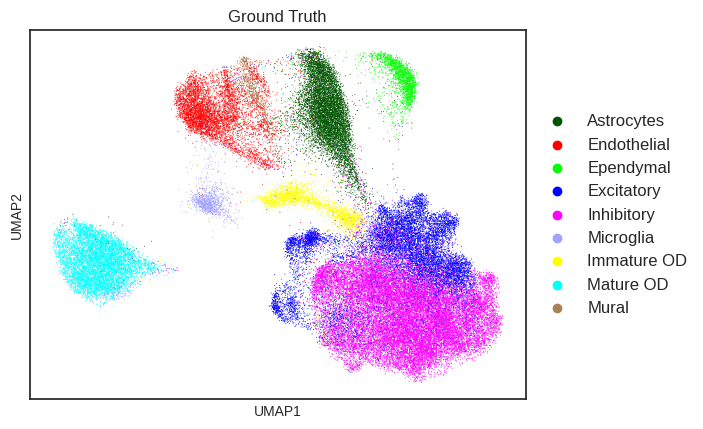

Draw umap of st dataset with SpaGDA.


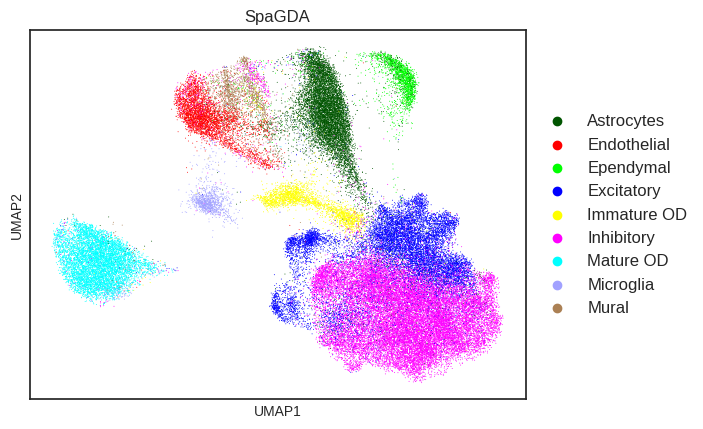

In [5]:
# process annotation results for Moffit dataset. for figure 3B and input data of 3C@美玲
'''
Processing Moffit dataset ...
===> Hpr results for Fig3C was restored in /data/bioinf/jyuan/rongboshen/SpaGDA/draw_fig3/Moffit/annotation/hpr_results.csv

===> Fig3B
Draw umap of st dataset with ground truth.
Draw umap of st dataset with SpaGDA.
'''

dataset = 'Moffit'
print('Processing %s dataset ...'%dataset)
if not os.path.exists(os.path.join(save_dir, dataset)): os.mkdir(os.path.join(save_dir, dataset))
sub_save_dir = os.path.join(save_dir, dataset, 'annotation')
if not os.path.exists(sub_save_dir): os.mkdir(sub_save_dir)
sub_data_dir = os.path.join(data_dir, dataset)

#sc_adata = sc.read(os.path.join(sub_data_dir,'sc.h5ad'))
#sc_adata = sc_adata[~sc_adata.obs['ctype'].isin(sc_del_types[dataset]),:]
#sc_adata.obs['Ground Truth'] = sc_adata.obs['ctype'].replace(['Immature oligodendrocyte','Mature oligodendrocyte'], ['Immature OD', 'Mature OD'])

st_adata = sc.read(os.path.join(sub_data_dir, 'modelGDAE-sample1.h5ad')) # this h5ad file restore the results of Spatial-ID and DNN

for method in methods: #['cellidcell', 'scibet', 'scmapcell', 'scnymcpu', 'seurat', 'singler'] in subdir merfish_result_3d, which predictions without filter Ambiguous
    sub_df = pd.read_csv(os.path.join(sub_data_dir, 'merfish_result_3d', method, 'sample1.csv'), index_col=0)
    sub_df = sub_df.reindex(st_adata.obs.index.to_list())
    st_adata.obs[method_names[method]] = list(sub_df['celltype_pred'].replace(sc_del_types[dataset]+['Immature oligodendrocyte','Mature oligodendrocyte'], ['unassigned']*5+['Immature OD', 'Mature OD']))

st_adata = st_adata[~st_adata.obs.Cell_class.isin(['Ambiguous']),:]
ori = ['Endothelial 1', 'Endothelial 2', 'Endothelial 3', 'Astrocyte', 'OD Immature 1', 'OD Immature 2', 'OD Mature 1', 'OD Mature 2', 'OD Mature 3', 'OD Mature 4', 'Pericytes']
tar = ['Endothelial', 'Endothelial', 'Endothelial', 'Astrocytes', 'Immature OD', 'Immature OD', 'Mature OD', 'Mature OD', 'Mature OD', 'Mature OD', 'Mural']
st_adata.obs['Ground Truth'] = st_adata.obs['Cell_class'].replace(ori, tar)

for nm in new_methods: #['tangram', 'cell2location'] in subdir merfish_result_3d, which predictions filter out Ambiguous
    sub_df = pd.read_csv(os.path.join(sub_data_dir, 'merfish_result_3d', nm, 'sample1.csv'), index_col=0)
    st_adata.obs[method_names[nm]] = list(sub_df['celltype_pred'].replace(sc_del_types[dataset]+['Immature oligodendrocyte','Mature oligodendrocyte'], ['unassigned']*5+['Immature OD', 'Mature OD']))

# Spatial-ID and DNN
st_adata.obs['Spatial-ID'] = st_adata.obs['celltype_pred'].replace(['Immature oligodendrocyte','Mature oligodendrocyte'], ['Immature OD', 'Mature OD'])
st_adata.obs['DNN'] = st_adata.obs['psuedo_class'].replace(['Immature oligodendrocyte','Mature oligodendrocyte'], ['Immature OD', 'Mature OD'])

# SpaGDA
SpaGDA_df = pd.read_csv(os.path.join(sub_data_dir, 'Results', 'best_results.csv'), index_col=0)
SpaGDA_df.rename(columns = {'Immature oligodendrocyte': 'Immature OD', 'Mature oligodendrocyte': 'Mature OD'}, inplace = True)
SpaGDA_labels = SpaGDA_df.columns.to_list()
st_adata.obs['SpaGDA'] = [SpaGDA_labels[i] for i in np.argmax(SpaGDA_df.to_numpy(), axis=1)]

hpr_results = st_adata.obs.copy()
hpr_result_path = os.path.join(sub_save_dir, 'hpr_results.csv')
hpr_results.to_csv(hpr_result_path) # restore the results of HPR dataset for Fig3C sankey figure
with open(os.path.join(sub_data_dir, 'selected_genes.json'), 'r') as f:
    markers = json.load(f)
print('===> Hpr results for Fig3C was restored in %s'%hpr_result_path)
    
st_adata = st_adata[:,st_adata.var_names.isin(markers)]
print('===> Fig3B')
# draw umap for each ST dataset, Testis use self-defined coordinates, Fig3B, Fig3D and Fig3E
print('Draw umap of st dataset with ground truth.')
draw_umap(st_adata.copy(), sub_save_dir, ext='st_'+dataset, annot='Ground Truth', color_pal=cell_type_colors[dataset], pca=True, normal=False)

print('Draw umap of st dataset with SpaGDA.')
draw_umap(st_adata.copy(), sub_save_dir, ext='SpaGDA_'+dataset, annot='SpaGDA', color_pal=cell_type_colors[dataset], pca=True, normal=False)

===> Acc for all slices of HPR:
SpaGDA acc, wf1: 0.9006, 0.9020
Spatial-ID acc, wf1: 0.8686, 0.8664
DNN acc, wf1: 0.8430, 0.8554
Cell-ID acc, wf1: 0.2984, 0.2926
SciBet acc, wf1: 0.5367, 0.5097
Scmap acc, wf1: 0.3384, 0.4526
ScNym acc, wf1: 0.6531, 0.5933
Seurat acc, wf1: 0.8142, 0.8083
SingleR acc, wf1: 0.7519, 0.7493
Tangram acc, wf1: 0.5862, 0.4973
Cell2location acc, wf1: 0.8081, 0.8153
===> Hpr results for Fig3F was restored in /data/bioinf/jyuan/rongboshen/SpaGDA/draw_fig3/Moffit/annotation/hpr_metrics.txt
Write demo slice for different methods. -- sample1
===> Acc on slice -0.29: {'SpaGDA': 0.8979517853906108, 'Spatial-ID': 0.8562624614826899, 'DNN': 0.8308863512778684, 'Cell-ID': 0.2885626246148269, 'SciBet': 0.5501178176545224, 'Scmap': 0.3126699293094073, 'ScNym': 0.5988762008337865, 'Seurat': 0.8116730106942178, 'SingleR': 0.7730650715968823, 'Tangram': 0.5142287475077034, 'Cell2location': 0.8299800616276962}
===> Acc on slice -0.14 for Fig3A: {'SpaGDA': 0.9065136685791427, '

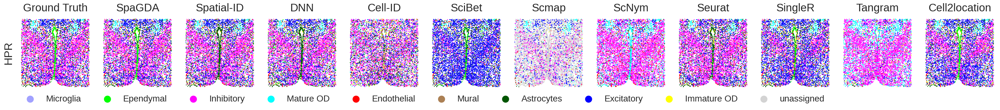

===> nc_acc, for Fig3G: [0.8757708977366288, 0.845525297873332, 0.8820002174824849, 0.8702716977614838, 0.9005949699408137, 0.8922995665884765, 0.8844701971323381, 0.8785826355770276]
nc_wf1: [0.8807104764205097, 0.8503562824715039, 0.8782580436160958, 0.8645530067629645, 0.9019587447054135, 0.8956070127097765, 0.884460157559502, 0.8789695215114768]
===> sg_acc, for Fig3H: [0.8787690491355071, 0.8690600096313672, 0.871794075155733, 0.868656113587995, 0.8693706988954997, 0.8921442219564103, 0.8900936728131359, 0.9005949699408137, 0.8978609044164478, 0.8879033135010019, 0.8902179485187889, 0.8863964705699594, 0.894054960930825]
sg_wf1: [0.8785852480130905, 0.8701199753689267, 0.8710491445401577, 0.8692366643414206, 0.8684539291589367, 0.8931186118439425, 0.8899037959206448, 0.9019587447054135, 0.9009456494589014, 0.8868970473049937, 0.8909530389677122, 0.886696094063373, 0.8963307262836733]


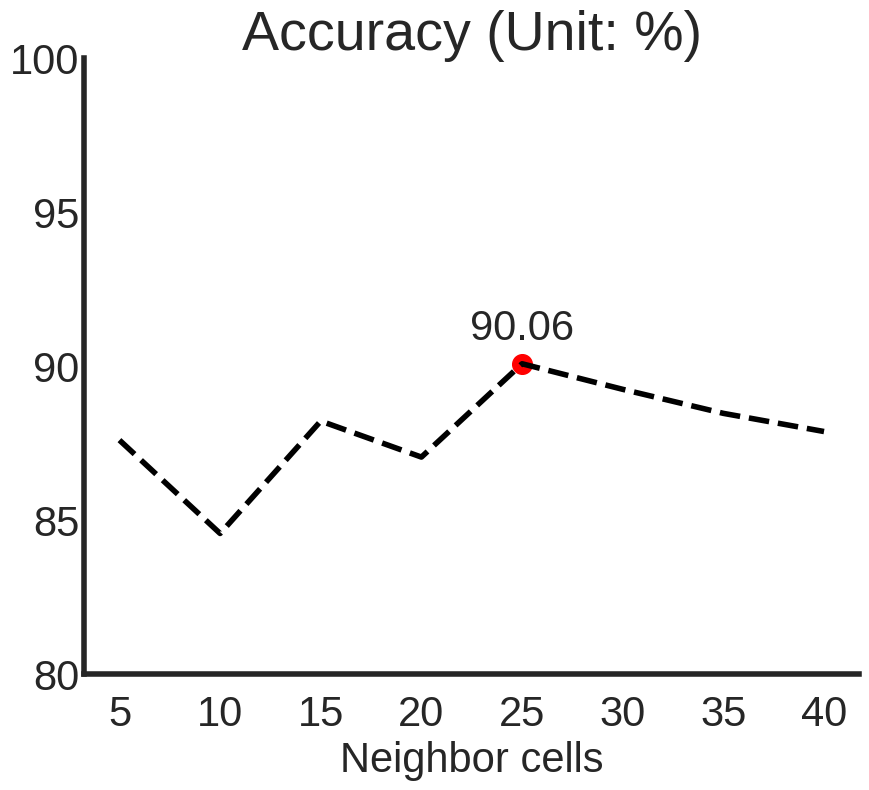

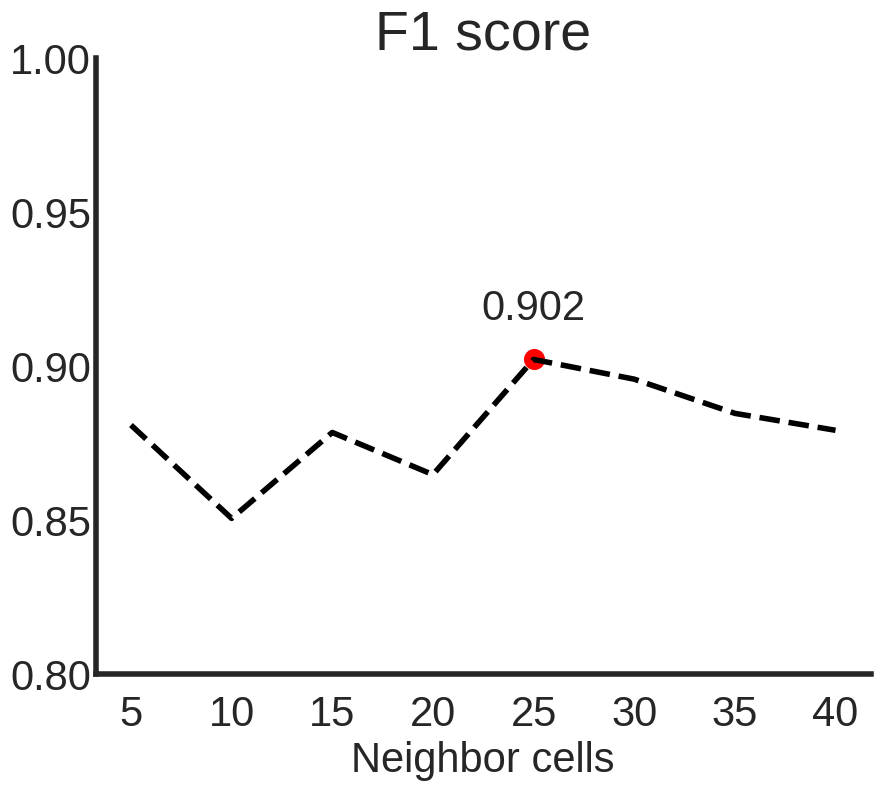

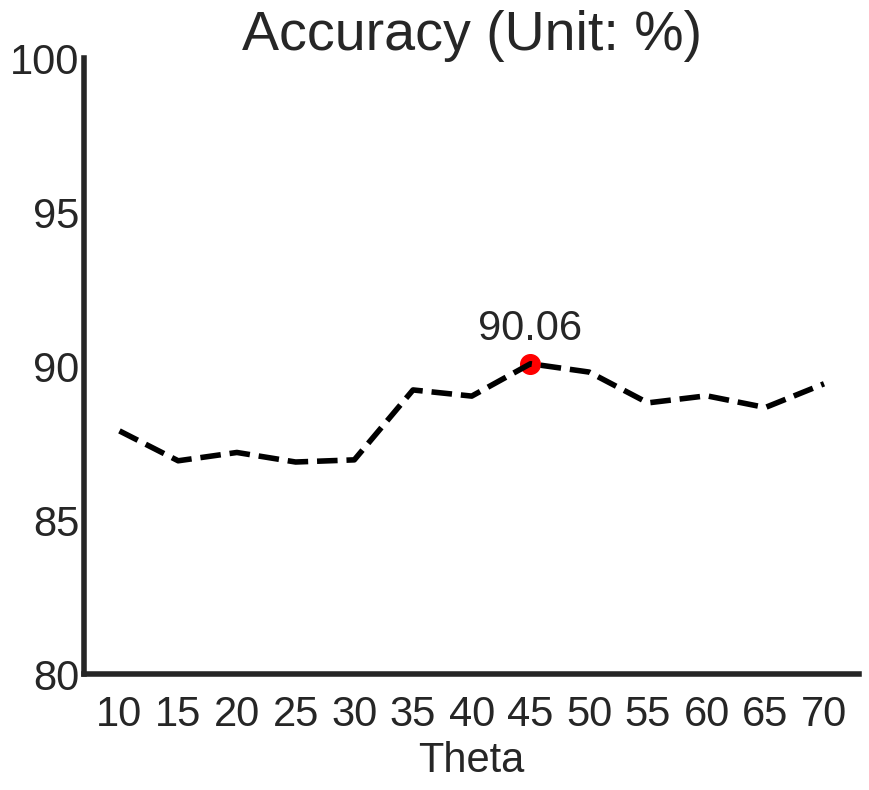

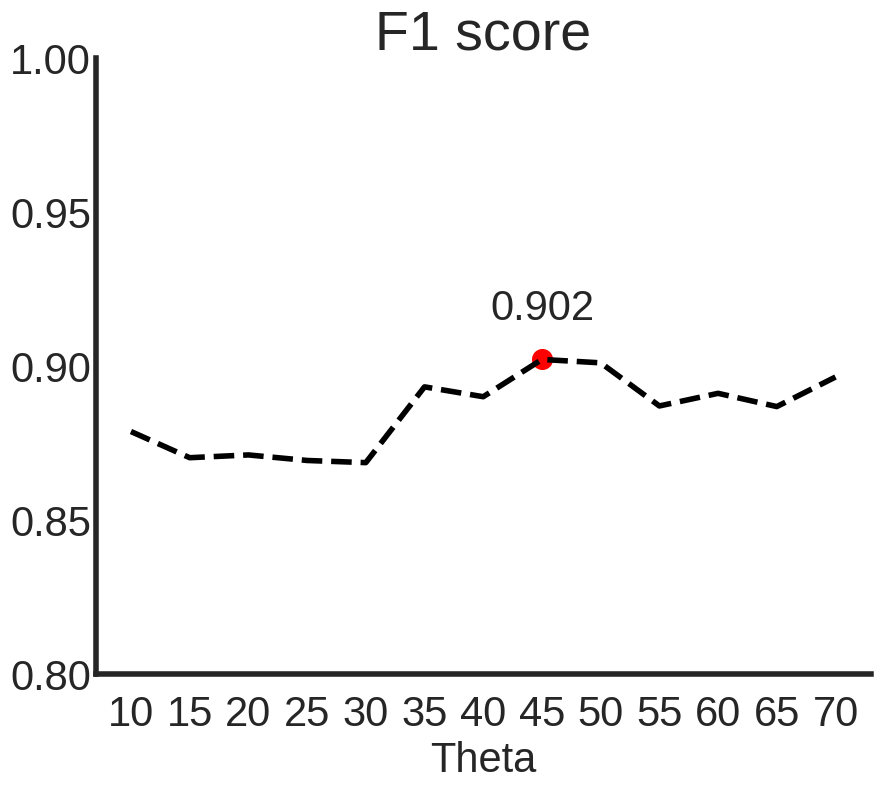

In [6]:
# Save accuracy and weighted F1 score. input data of figure 3F @文灿
'''
===> Acc for all slices of HPR:
SpaGDA acc, wf1: 0.9006, 0.9020
Spatial-ID acc, wf1: 0.8686, 0.8664
DNN acc, wf1: 0.8430, 0.8554
Cell-ID acc, wf1: 0.2984, 0.2926
SciBet acc, wf1: 0.5367, 0.5097
Scmap acc, wf1: 0.3384, 0.4526
ScNym acc, wf1: 0.6531, 0.5933
Seurat acc, wf1: 0.8142, 0.8083
SingleR acc, wf1: 0.7519, 0.7493
Tangram acc, wf1: 0.5862, 0.4973
Cell2location acc, wf1: 0.8081, 0.8153
===> Hpr results for Fig3F was restored in /data/bioinf/jyuan/rongboshen/SpaGDA/draw_fig3/Moffit/annotation/hpr_metrics.txt

Write demo slice for different methods. -- sample1
===> Acc on slice -0.14 for Fig3A: {'SpaGDA': 0.9065136685791427, 'Spatial-ID': 0.8538643266959163, 'DNN': 0.835302058724266, 'Cell-ID': 0.34205197435032064, 'SciBet': 0.5134998312521093, 'Scmap': 0.3133648329395883, 'ScNym': 0.6461356733040837, 'Seurat': 0.8061086736415795, 'SingleR': 0.7374282821464732, 'Tangram': 0.5902801214984813, 'Cell2location': 0.8032399595005062}
==> Demo slice -0.14 for Fig3A

===> nc_acc, for Fig3G: [0.8757708977366288, 0.845525297873332, 0.8820002174824849, 0.8702716977614838, 0.9005949699408137, 0.8922995665884765, 0.8844701971323381, 0.8785826355770276]
===> sg_acc, for Fig3H: [0.8787690491355071, 0.8690600096313672, 0.871794075155733, 0.868656113587995, 0.8693706988954997, 0.8921442219564103, 0.8900936728131359, 0.9005949699408137, 0.8978609044164478, 0.8879033135010019, 0.8902179485187889, 0.8863964705699594, 0.894054960930825]
'''

acc_file_path = os.path.join(sub_save_dir, 'hpr_metrics.txt')
fs = open(acc_file_path, 'w')

# Save confusion matrix.
matrix_save_dir = os.path.join(sub_save_dir, 'matrix')
if not os.path.exists(matrix_save_dir): os.makedirs(matrix_save_dir)

acc_all_methods = []
wf1_all_methods = []
all_methods = []
if dataset == 'Mop': # MOP dataset filter ['L4/5 IT', 'L6 IT Car3'] for calculate acc and F1, because reference dataset do not contain this cell types.
    st_adata_visual = st_adata.copy()
    st_adata = st_adata[~st_adata.obs['Ground Truth'].isin(['L4/5 IT', 'L6 IT Car3']), :]
label_true = st_adata.obs['Ground Truth'].to_list()
cell_labels = cell_types[dataset]

# SpaGDA, calculate acc, F1, and confusion matrix.
SpaGDA_pred = st_adata.obs['SpaGDA'].to_list()
acc = np.sum(np.array(label_true) == np.array(SpaGDA_pred)) *1.0 / len(SpaGDA_pred)
wf1 = f1_score(np.array(label_true), np.array(SpaGDA_pred), average='weighted', labels=cell_labels)
acc_all_methods.append(acc)
wf1_all_methods.append(wf1)
all_methods.append('SpaGDA')
print('===> Acc for all slices of HPR:')
print('SpaGDA acc, wf1: %.4f, %.4f'%(acc, wf1))
fs.write('SpaGDA acc, wf1: %.4f, %.4f'%(acc, wf1))
SpaGDA_confusion_matrix = confusion_matrix(label_true, SpaGDA_pred, labels=cell_labels)
draw_matrix_map(SpaGDA_confusion_matrix, matrix_save_dir, 'SpaGDA_matrix', cell_labels, cell_labels)

# Spatial-ID
spatialid_pred = st_adata.obs['Spatial-ID'].to_list()
acc = np.sum(np.array(label_true) == np.array(spatialid_pred)) *1.0 / len(spatialid_pred)
wf1 = f1_score(np.array(label_true), np.array(spatialid_pred), average='weighted', labels=cell_labels)
acc_all_methods.append(acc)
wf1_all_methods.append(wf1)
all_methods.append('Spatial-ID')
print('Spatial-ID acc, wf1: %.4f, %.4f'%(acc, wf1))
fs.write('Spatial-ID acc, wf1: %.4f, %.4f'%(acc, wf1))
spatial_confusion_matrix = confusion_matrix(label_true, spatialid_pred, labels=cell_labels)
draw_matrix_map(spatial_confusion_matrix, matrix_save_dir, 'spatialid_matrix', cell_labels, cell_labels)

# DNN
DNN_pred = st_adata.obs['DNN'].to_list()
acc = np.sum(np.array(label_true) == np.array(DNN_pred)) *1.0 / len(DNN_pred)
wf1 = f1_score(np.array(label_true), np.array(DNN_pred), average='weighted', labels=cell_labels)
acc_all_methods.append(acc)
wf1_all_methods.append(wf1)
all_methods.append('DNN')
print('DNN acc, wf1: %.4f, %.4f'%(acc, wf1))
fs.write('DNN acc, wf1: %.4f, %.4f'%(acc, wf1))
DNN_confusion_matrix = confusion_matrix(label_true, DNN_pred, labels=cell_labels)
draw_matrix_map(DNN_confusion_matrix, matrix_save_dir, 'DNN_matrix', cell_labels, cell_labels)

other_methods = [method_names[i] for i in methods + new_methods] 
all_methods = all_methods + other_methods
for method in other_methods:
    compare_pred = st_adata.obs[method].to_list()
    acc = np.sum(np.array(label_true) == np.array(compare_pred)) *1.0 / len(compare_pred)
    wf1 = f1_score(np.array(label_true), np.array(compare_pred), average='weighted', labels=cell_labels)
    acc_all_methods.append(acc)
    wf1_all_methods.append(wf1)
    print('%s acc, wf1: %.4f, %.4f'%(method, acc, wf1))
    fs.write('%s acc, wf1: %.4f, %.4f'%(method, acc, wf1)) 
    _confusion_matrix = confusion_matrix(label_true, compare_pred, labels=cell_labels)
    draw_matrix_map(_confusion_matrix, matrix_save_dir, '%s_matrix'%method, cell_labels, cell_labels)

fs.close() # Fig3F
print('===> Hpr results for Fig3F was restored in %s'%acc_file_path)

acc_all_arr[0] = np.array(acc_all_methods)
wf1_all_arr[0] = np.array(wf1_all_methods)

# Draw demo slices

draw_spatial_hpr(sub_save_dir, st_adata, all_methods, cell_type_colors[dataset]) # Fig3A
robustness_test(sub_data_dir, sub_save_dir, label_true, cell_labels) # Fig3G and Fig3H

Processing Mop dataset ...
===> Fig3D
Draw umap of st dataset with ground truth.


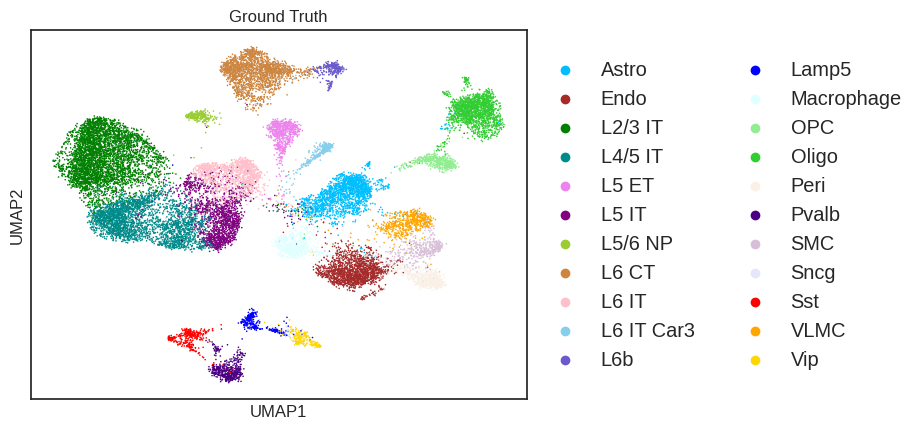

Draw umap of st dataset with SpaGDA.


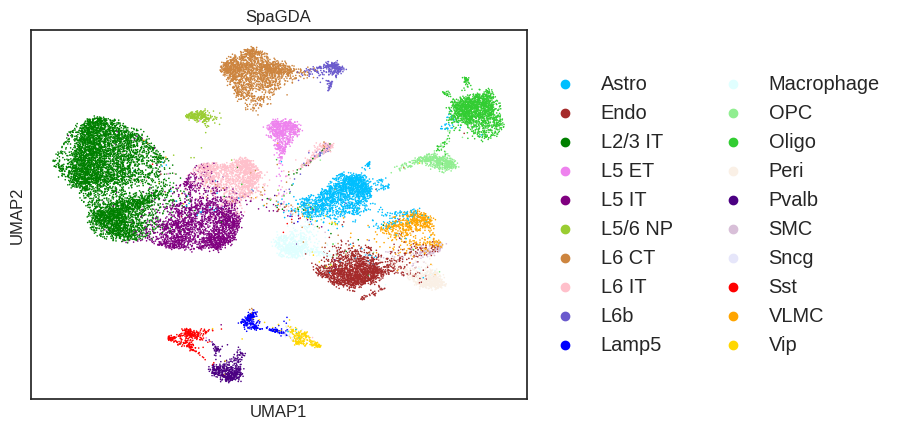

In [7]:
# process annotation results for Mop dataset.
'''
===> Fig3D
Draw umap of st dataset with ground truth.
Draw umap of st dataset with SpaGDA.
'''

dataset = 'Mop'

print('Processing %s dataset ...'%dataset)
if not os.path.exists(os.path.join(save_dir, dataset)): os.mkdir(os.path.join(save_dir, dataset))
sub_save_dir = os.path.join(save_dir, dataset, 'annotation')
if not os.path.exists(sub_save_dir): os.mkdir(sub_save_dir)
sub_data_dir = os.path.join(data_dir, dataset)

#sc_adata = sc.read(os.path.join(sub_data_dir,'mop.h5ad'))
#sc_adata = sc_adata[sc_adata.obs['Allen.subclass_label'].isin(cell_types[dataset]),:]
#sc_adata.obs['Ground Truth'] = sc_adata.obs['Allen.subclass_label']

st_adata = sc.read(os.path.join(sub_data_dir, 'modelGDAE-mouse1_sample3.h5ad'))
for method in methods+new_methods:
    sub_df = pd.read_csv(os.path.join(sub_data_dir, 'merfish_result', method, 'mouse1_sample3.csv'), index_col=0)
    sub_df = sub_df.reindex(st_adata.obs.index.to_list())
    st_adata.obs[method_names[method]] = list(sub_df['celltype_pred'].replace(sc_del_types[dataset]+['Micro'], ['unassigned']*2+['Macrophage']))

# Spatial-ID and DNN
st_adata.obs['Spatial-ID'] = st_adata.obs['celltype_pred'].replace(['Micro'], ['Macrophage'])
st_adata.obs['DNN'] = st_adata.obs['pseudo_class'].replace(['Micro'], ['Macrophage'])

# SpaGDA
SpaGDA_df = pd.read_csv(os.path.join(sub_data_dir, 'best_dagcn_prediction.csv'), index_col=0)
SpaGDA_df.rename(columns = {'Micro': 'Macrophage'}, inplace = True)
SpaGDA_labels = SpaGDA_df.columns.to_list()
st_adata.obs['SpaGDA'] = [SpaGDA_labels[i] for i in np.argmax(SpaGDA_df.to_numpy(), axis=1)]

st_adata = st_adata[~st_adata.obs.subclass.isin(['other', 'PVM']),:]
st_adata.obs['Ground Truth'] = st_adata.obs['subclass'].replace(['Micro'], ['Macrophage'])

with open(os.path.join(sub_data_dir, 'shared_genes.json'), 'r') as f:
    markers = json.load(f)

st_adata = st_adata[:,st_adata.var_names.isin(markers)]

# draw umap for each ST dataset, Testis use self-defined coordinates, Fig3B, Fig3D and Fig3E
print('===> Fig3D')
print('Draw umap of st dataset with ground truth.')
draw_umap(st_adata.copy(), sub_save_dir, ext='st_'+dataset, annot='Ground Truth', color_pal=cell_type_colors[dataset], pca=True, normal=False)
print('Draw umap of st dataset with SpaGDA.')
draw_umap(st_adata.copy(), sub_save_dir, ext='SpaGDA_'+dataset, annot='SpaGDA', color_pal=cell_type_colors[dataset], pca=True, normal=False)

===> Acc for all slices of Mop:
SpaGDA acc, wf1: 0.9341, 0.9307
Spatial-ID acc, wf1: 0.9292, 0.9224
DNN acc, wf1: 0.9175, 0.9128
Cell-ID acc, wf1: 0.1744, 0.1613
SciBet acc, wf1: 0.8978, 0.9058
Scmap acc, wf1: 0.7163, 0.7644
ScNym acc, wf1: 0.8826, 0.8668
Seurat acc, wf1: 0.8468, 0.8461
SingleR acc, wf1: 0.9119, 0.9095
Tangram acc, wf1: 0.8416, 0.8225
Cell2location acc, wf1: 0.9233, 0.9223
==> Mop results for Fig3F was restored in /data/bioinf/jyuan/rongboshen/SpaGDA/draw_fig3/Mop/annotation/mop_metrics.txt
Write slice mouse1_slice112 for different methods...


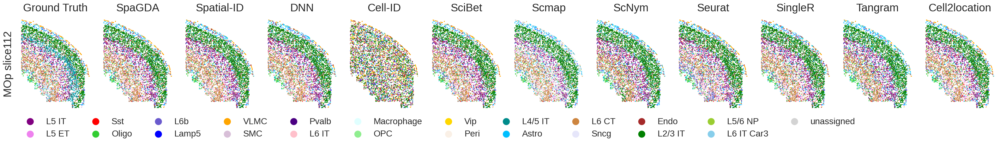

Write slice mouse1_slice131 for different methods...


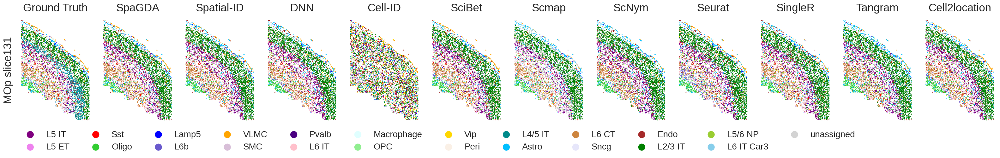

Write slice mouse1_slice153 for different methods...


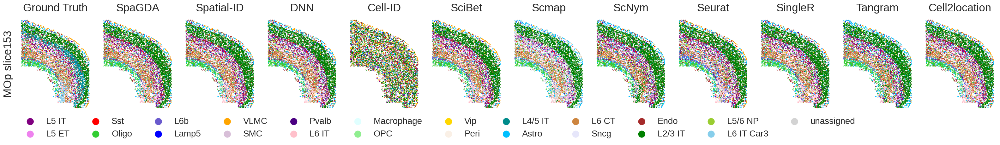

===> Acc on slice mouse1_slice153: {'SpaGDA': 0.9345887016848364, 'Spatial-ID': 0.929633300297324, 'DNN': 0.9187314172447968, 'Cell-ID': 0.17112652791542782, 'SciBet': 0.8931285100759828, 'Scmap': 0.7234886025768087, 'ScNym': 0.8909811694747275, 'Seurat': 0.8462173769408655, 'SingleR': 0.9157581764122894, 'Tangram': 0.8477039973571192, 'Cell2location': 0.9255037991410637}
Write slice mouse1_slice122 for different methods...


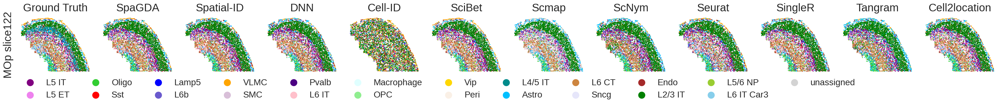

In [8]:
# Save accuracy and weighted F1 score. input data of figure 3F @文灿
'''
===> Acc for all slices of Mop:
SpaGDA acc, wf1: 0.9341, 0.9307
Spatial-ID acc, wf1: 0.9292, 0.9224
DNN acc, wf1: 0.9175, 0.9128
Cell-ID acc, wf1: 0.1744, 0.1613
SciBet acc, wf1: 0.8978, 0.9058
Scmap acc, wf1: 0.7163, 0.7644
ScNym acc, wf1: 0.8826, 0.8668
Seurat acc, wf1: 0.8468, 0.8461
SingleR acc, wf1: 0.9119, 0.9095
Tangram acc, wf1: 0.8416, 0.8225
Cell2location acc, wf1: 0.9233, 0.9223
==> Mop results for Fig3F was restored in /data/bioinf/jyuan/rongboshen/SpaGDA/draw_fig3/Mop/annotation/mop_metrics.txt
'''

mop_result_path = os.path.join(sub_save_dir, 'mop_metrics.txt')
fs = open(mop_result_path, 'w')

# Save confusion matrix.
matrix_save_dir = os.path.join(sub_save_dir, 'matrix')
if not os.path.exists(matrix_save_dir): os.makedirs(matrix_save_dir)

acc_all_methods = []
wf1_all_methods = []
all_methods = []
if dataset == 'Mop': # MOP dataset filter ['L4/5 IT', 'L6 IT Car3'] for calculate acc and F1, because reference dataset do not contain this cell types.
    st_adata_visual = st_adata.copy()
    st_adata = st_adata[~st_adata.obs['Ground Truth'].isin(['L4/5 IT', 'L6 IT Car3']), :]
label_true = st_adata.obs['Ground Truth'].to_list()
cell_labels = cell_types[dataset]

# SpaGDA, calculate acc, F1, and confusion matrix.
SpaGDA_pred = st_adata.obs['SpaGDA'].to_list()
acc = np.sum(np.array(label_true) == np.array(SpaGDA_pred)) *1.0 / len(SpaGDA_pred)
wf1 = f1_score(np.array(label_true), np.array(SpaGDA_pred), average='weighted', labels=cell_labels)
acc_all_methods.append(acc)
wf1_all_methods.append(wf1)
all_methods.append('SpaGDA')
print('===> Acc for all slices of Mop:')
print('SpaGDA acc, wf1: %.4f, %.4f'%(acc, wf1))
fs.write('SpaGDA acc, wf1: %.4f, %.4f'%(acc, wf1))
SpaGDA_confusion_matrix = confusion_matrix(label_true, SpaGDA_pred, labels=cell_labels)
draw_matrix_map(SpaGDA_confusion_matrix, matrix_save_dir, 'SpaGDA_matrix', cell_labels, cell_labels)

# Spatial-ID
spatialid_pred = st_adata.obs['Spatial-ID'].to_list()
acc = np.sum(np.array(label_true) == np.array(spatialid_pred)) *1.0 / len(spatialid_pred)
wf1 = f1_score(np.array(label_true), np.array(spatialid_pred), average='weighted', labels=cell_labels)
acc_all_methods.append(acc)
wf1_all_methods.append(wf1)
all_methods.append('Spatial-ID')
print('Spatial-ID acc, wf1: %.4f, %.4f'%(acc, wf1))
fs.write('Spatial-ID acc, wf1: %.4f, %.4f'%(acc, wf1))
spatial_confusion_matrix = confusion_matrix(label_true, spatialid_pred, labels=cell_labels)
draw_matrix_map(spatial_confusion_matrix, matrix_save_dir, 'spatialid_matrix', cell_labels, cell_labels)

# DNN
DNN_pred = st_adata.obs['DNN'].to_list()
acc = np.sum(np.array(label_true) == np.array(DNN_pred)) *1.0 / len(DNN_pred)
wf1 = f1_score(np.array(label_true), np.array(DNN_pred), average='weighted', labels=cell_labels)
acc_all_methods.append(acc)
wf1_all_methods.append(wf1)
all_methods.append('DNN')
print('DNN acc, wf1: %.4f, %.4f'%(acc, wf1))
fs.write('DNN acc, wf1: %.4f, %.4f'%(acc, wf1))
DNN_confusion_matrix = confusion_matrix(label_true, DNN_pred, labels=cell_labels)
draw_matrix_map(DNN_confusion_matrix, matrix_save_dir, 'DNN_matrix', cell_labels, cell_labels)

other_methods = [method_names[i] for i in methods + new_methods] 
all_methods = all_methods + other_methods
for method in other_methods:
    compare_pred = st_adata.obs[method].to_list()
    acc = np.sum(np.array(label_true) == np.array(compare_pred)) *1.0 / len(compare_pred)
    wf1 = f1_score(np.array(label_true), np.array(compare_pred), average='weighted', labels=cell_labels)
    acc_all_methods.append(acc)
    wf1_all_methods.append(wf1)
    print('%s acc, wf1: %.4f, %.4f'%(method, acc, wf1))
    fs.write('%s acc, wf1: %.4f, %.4f'%(method, acc, wf1)) 
    _confusion_matrix = confusion_matrix(label_true, compare_pred, labels=cell_labels)
    draw_matrix_map(_confusion_matrix, matrix_save_dir, '%s_matrix'%method, cell_labels, cell_labels)

fs.close() # Fig3F
print('==> Mop results for Fig3F was restored in %s'%mop_result_path)

acc_all_arr[1] = np.array(acc_all_methods)
wf1_all_arr[1] = np.array(wf1_all_methods)

# Draw demo slices

draw_spatial_mop(sub_save_dir, st_adata_visual, all_methods, cell_type_colors[dataset]) # Fig S

Processing Sperm dataset ...
===> Fig3E
Draw umap of st dataset with ground truth.


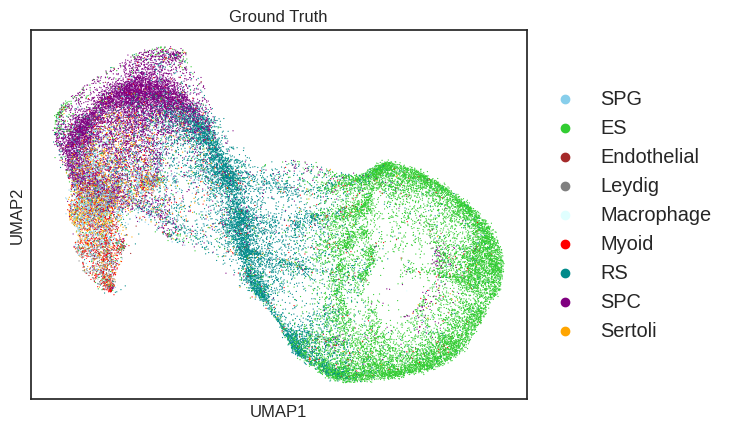

Draw umap of st dataset with SpaGDA.


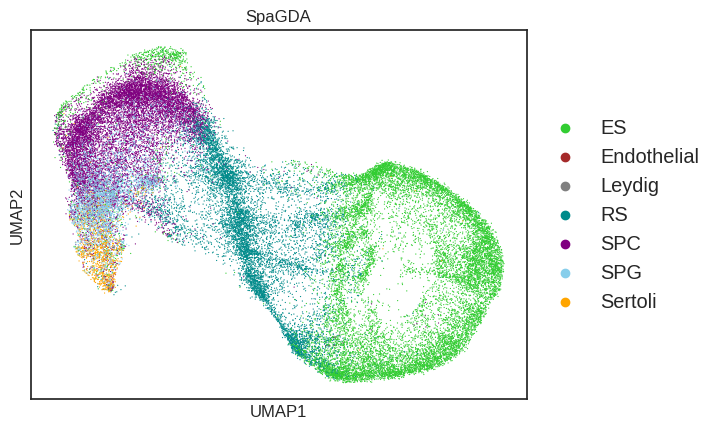

In [9]:
# process annotation results for Sperm dataset.
'''
===> Fig3E
Draw umap of st dataset with ground truth.
Draw umap of st dataset with SpaGDA.
'''

dataset = 'Sperm'

print('Processing %s dataset ...'%dataset)
if not os.path.exists(os.path.join(save_dir, dataset)): os.mkdir(os.path.join(save_dir, dataset))
sub_save_dir = os.path.join(save_dir, dataset, 'annotation')
if not os.path.exists(sub_save_dir): os.mkdir(sub_save_dir)
sub_data_dir = os.path.join(data_dir, dataset)

#sc_adata = sc.read(os.path.join(sub_data_dir,'mouse_testes.h5ad'))
#sc_adata = sc_adata[~sc_adata.obs['type_names'].isin(sc_del_types[dataset]),:]
#sc_adata.obs['Ground Truth'] = sc_adata.obs['type_names'].replace(['Scytes', 'STids', 'Elongating'], ['SPC', 'RS', 'ES'])

st_adata = sc.read(os.path.join(sub_data_dir, 'modelGDAE-WT3.h5ad'))
for method in methods+new_methods:
    sub_df = pd.read_csv(os.path.join(sub_data_dir, 'result_slide', method, 'WT3.csv'), index_col=0)
    sub_df = sub_df.reindex(st_adata.obs.index.to_list())
    pred_list = sub_df['celltype_pred'].replace(['Scytes', 'STids', 'Elongating'], ['SPC', 'RS', 'ES'])
    st_adata.obs[method_names[method]] = [i if i in cell_types[dataset] else 'unassigned' for i in pred_list]

# Spatial-ID and DNN
st_adata.obs['Spatial-ID'] = st_adata.obs['celltype_pred'].replace(['Scytes', 'STids', 'Elongating'], ['SPC', 'RS', 'ES'])
st_adata.obs['DNN'] = st_adata.obs['pseudo_class'].replace(['Scytes', 'STids', 'Elongating'], ['SPC', 'RS', 'ES'])

# SpaGDA
SpaGDA_df = pd.read_csv(os.path.join(sub_data_dir, 'best_dagcn_prediction.csv'), index_col=0)
SpaGDA_df.rename(columns = {'Scytes': 'SPC', 'STids': 'RS', 'Elongating': 'ES'}, inplace = True)
SpaGDA_labels = SpaGDA_df.columns.to_list()
st_adata.obs['SpaGDA'] = [SpaGDA_labels[i] for i in np.argmax(SpaGDA_df.to_numpy(), axis=1)]
 
st_adata.obs['Ground Truth'] = st_adata.obs['ct_name'].replace(['Differentiating SPG'], ['SPG']) 

with open(os.path.join(sub_data_dir, 'shared_genes.json'), 'r') as f:
    markers = json.load(f)

st_adata = st_adata[:,st_adata.var_names.isin(markers)]

# draw umap for each ST dataset, Testis use self-defined coordinates, Fig3B, Fig3D and Fig3E

umap_coords = pd.read_csv(os.path.join(sub_data_dir, 'W3_umap.txt'), index_col=0, sep='\t')
umap_coords = umap_coords.reindex(st_adata.obs.index.to_list())
st_adata.obsm['X_umap'] = umap_coords.to_numpy()

plt.style.use('seaborn-white') 
sc.settings.figdir = sub_save_dir
print('===> Fig3E')
print('Draw umap of st dataset with ground truth.')
sc.pl.umap(st_adata, color='Ground Truth', palette=cell_type_colors[dataset], legend_fontsize='large')
print('Draw umap of st dataset with SpaGDA.')
sc.pl.umap(st_adata, color='SpaGDA', palette=cell_type_colors[dataset], legend_fontsize='large')

===> Acc on Testis:
SpaGDA acc, wf1: 0.7055, 0.6795
Spatial-ID acc, wf1: 0.6982, 0.6563
DNN acc, wf1: 0.6655, 0.6301
Cell-ID acc, wf1: 0.6442, 0.6469
SciBet acc, wf1: 0.5483, 0.5135
Scmap acc, wf1: 0.3013, 0.3783
ScNym acc, wf1: 0.6500, 0.6215
Seurat acc, wf1: 0.6513, 0.6457
SingleR acc, wf1: 0.6613, 0.6166
Tangram acc, wf1: 0.6430, 0.6178
Cell2location acc, wf1: 0.6903, 0.6702
Testis result for Fig3F was restored in /data/bioinf/jyuan/rongboshen/SpaGDA/draw_fig3/Sperm/annotation/testis_metrics.txt
Write demo for different methods.


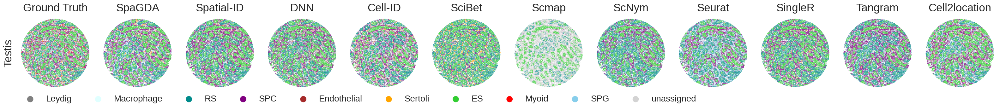

In [10]:
# Save accuracy and weighted F1 score. input data of figure 3F
'''
===> Acc on Testis:
SpaGDA acc, wf1: 0.7055, 0.6795
Spatial-ID acc, wf1: 0.6982, 0.6563
DNN acc, wf1: 0.6655, 0.6301
Cell-ID acc, wf1: 0.6442, 0.6469
SciBet acc, wf1: 0.5483, 0.5135
Scmap acc, wf1: 0.3013, 0.3783
ScNym acc, wf1: 0.6500, 0.6215
Seurat acc, wf1: 0.6513, 0.6457
SingleR acc, wf1: 0.6613, 0.6166
Tangram acc, wf1: 0.6430, 0.6178
Cell2location acc, wf1: 0.6903, 0.6702
Testis result for Fig3F was restored in /data/bioinf/jyuan/rongboshen/SpaGDA/draw_fig3/Sperm/annotation/testis_metrics.txt
'''

testis_result_path = os.path.join(sub_save_dir, 'testis_metrics.txt')
fs = open(testis_result_path, 'w')

# Save confusion matrix.
matrix_save_dir = os.path.join(sub_save_dir, 'matrix')
if not os.path.exists(matrix_save_dir): os.makedirs(matrix_save_dir)

acc_all_methods = []
wf1_all_methods = []
all_methods = []
if dataset == 'Mop': # MOP dataset filter ['L4/5 IT', 'L6 IT Car3'] for calculate acc and F1, because reference dataset do not contain this cell types.
    st_adata_visual = st_adata.copy()
    st_adata = st_adata[~st_adata.obs['Ground Truth'].isin(['L4/5 IT', 'L6 IT Car3']), :]
label_true = st_adata.obs['Ground Truth'].to_list()
cell_labels = cell_types[dataset]

# SpaGDA, calculate acc, F1, and confusion matrix.
SpaGDA_pred = st_adata.obs['SpaGDA'].to_list()
acc = np.sum(np.array(label_true) == np.array(SpaGDA_pred)) *1.0 / len(SpaGDA_pred)
wf1 = f1_score(np.array(label_true), np.array(SpaGDA_pred), average='weighted', labels=cell_labels)
acc_all_methods.append(acc)
wf1_all_methods.append(wf1)
all_methods.append('SpaGDA')
print('===> Acc on Testis:')
print('SpaGDA acc, wf1: %.4f, %.4f'%(acc, wf1))
fs.write('SpaGDA acc, wf1: %.4f, %.4f'%(acc, wf1))
SpaGDA_confusion_matrix = confusion_matrix(label_true, SpaGDA_pred, labels=cell_labels)
draw_matrix_map(SpaGDA_confusion_matrix, matrix_save_dir, 'SpaGDA_matrix', cell_labels, cell_labels)

# Spatial-ID
spatialid_pred = st_adata.obs['Spatial-ID'].to_list()
acc = np.sum(np.array(label_true) == np.array(spatialid_pred)) *1.0 / len(spatialid_pred)
wf1 = f1_score(np.array(label_true), np.array(spatialid_pred), average='weighted', labels=cell_labels)
acc_all_methods.append(acc)
wf1_all_methods.append(wf1)
all_methods.append('Spatial-ID')
print('Spatial-ID acc, wf1: %.4f, %.4f'%(acc, wf1))
fs.write('Spatial-ID acc, wf1: %.4f, %.4f'%(acc, wf1))
spatial_confusion_matrix = confusion_matrix(label_true, spatialid_pred, labels=cell_labels)
draw_matrix_map(spatial_confusion_matrix, matrix_save_dir, 'spatialid_matrix', cell_labels, cell_labels)

# DNN
DNN_pred = st_adata.obs['DNN'].to_list()
acc = np.sum(np.array(label_true) == np.array(DNN_pred)) *1.0 / len(DNN_pred)
wf1 = f1_score(np.array(label_true), np.array(DNN_pred), average='weighted', labels=cell_labels)
acc_all_methods.append(acc)
wf1_all_methods.append(wf1)
all_methods.append('DNN')
print('DNN acc, wf1: %.4f, %.4f'%(acc, wf1))
fs.write('DNN acc, wf1: %.4f, %.4f'%(acc, wf1))
DNN_confusion_matrix = confusion_matrix(label_true, DNN_pred, labels=cell_labels)
draw_matrix_map(DNN_confusion_matrix, matrix_save_dir, 'DNN_matrix', cell_labels, cell_labels)

other_methods = [method_names[i] for i in methods + new_methods] 
all_methods = all_methods + other_methods
for method in other_methods:
    compare_pred = st_adata.obs[method].to_list()
    acc = np.sum(np.array(label_true) == np.array(compare_pred)) *1.0 / len(compare_pred)
    wf1 = f1_score(np.array(label_true), np.array(compare_pred), average='weighted', labels=cell_labels)
    acc_all_methods.append(acc)
    wf1_all_methods.append(wf1)
    print('%s acc, wf1: %.4f, %.4f'%(method, acc, wf1))
    fs.write('%s acc, wf1: %.4f, %.4f'%(method, acc, wf1)) 
    _confusion_matrix = confusion_matrix(label_true, compare_pred, labels=cell_labels)
    draw_matrix_map(_confusion_matrix, matrix_save_dir, '%s_matrix'%method, cell_labels, cell_labels)

fs.close() # Fig3F
print('Testis result for Fig3F was restored in %s'%testis_result_path)

acc_all_arr[2] = np.array(acc_all_methods)
wf1_all_arr[2] = np.array(wf1_all_methods)

# Draw demo slices

draw_spatial_testis(sub_save_dir, st_adata, all_methods, cell_type_colors[dataset]) # Fig S

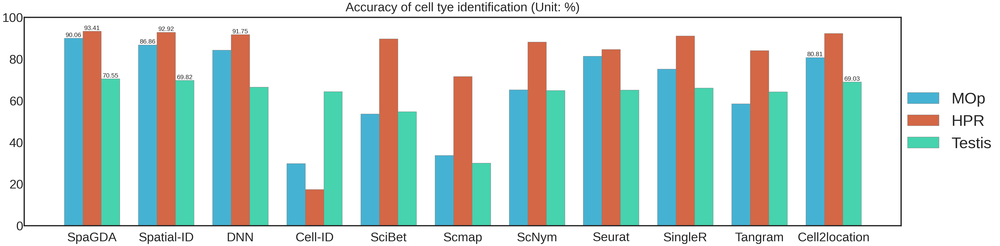

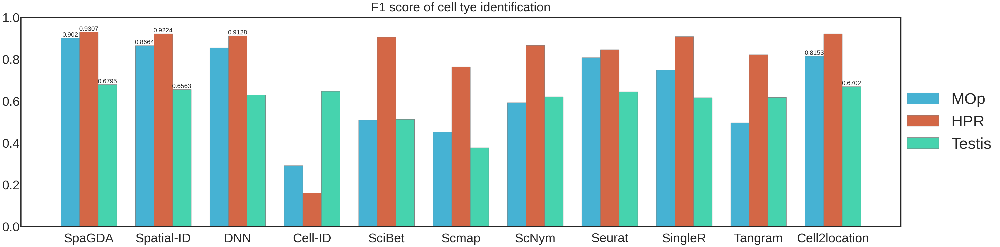

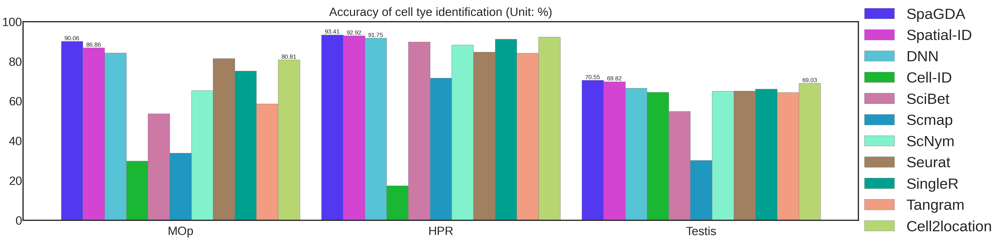

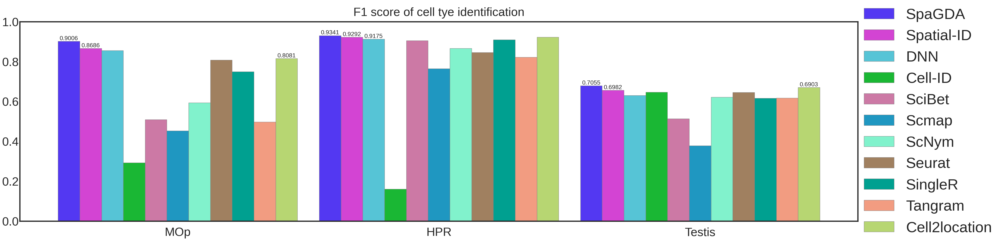

In [11]:
# the follow figures are obsoleted.
# Draw acc bar, obsolete
plt.style.use('seaborn-white')  
fig, ax = plt.subplots(figsize=(50,12))
ax.spines[['top','bottom','left','right']].set_linewidth(4)
barWidth = 0.25
xaxis = np.arange(len(all_methods))
for seq, dataset in enumerate(datasets):
    ax.bar(xaxis, acc_all_arr[seq]*100, color=dataset_color_pal[dataset_names[seq]], width=barWidth, edgecolor='grey', label=dataset_names[seq])
    ax.text(xaxis[0], acc_all_arr[seq,0]*100, round(acc_all_arr[seq,0]*100,2), ha='center', va='bottom', fontsize=20)
    if dataset == 'Mop':
        ax.text(xaxis[1], acc_all_arr[seq,1]*100, round(acc_all_arr[seq,1]*100,2), ha='center', va='bottom', fontsize=20)
        ax.text(xaxis[-1], acc_all_arr[seq,-1]*100, round(acc_all_arr[seq,-1]*100,2), ha='center', va='bottom', fontsize=20)
    elif dataset == 'Moffit':
        ax.text(xaxis[1], acc_all_arr[seq,1]*100, round(acc_all_arr[seq,1]*100,2), ha='center', va='bottom', fontsize=20)
        ax.text(xaxis[2], acc_all_arr[seq,2]*100, round(acc_all_arr[seq,2]*100,2), ha='center', va='bottom', fontsize=20)
    else:
        ax.text(xaxis[1], acc_all_arr[seq,1]*100, round(acc_all_arr[seq,1]*100,2), ha='center', va='bottom', fontsize=20)
        ax.text(xaxis[-1], acc_all_arr[seq,-1]*100, round(acc_all_arr[seq,-1]*100,2), ha='center', va='bottom', fontsize=20)
    xaxis = xaxis + barWidth
ax.set_ylim(0,100)
ax.set_xticks(np.arange(len(all_methods))+barWidth, all_methods)
ax.set_title('Accuracy of cell tye identification (Unit: %)', fontsize=40, pad=20)
ax.tick_params(axis='x', labelsize=40, pad=20)
ax.tick_params(axis='y', labelsize=40)
ax.legend(bbox_to_anchor=(1,0.5),loc=6, fontsize=50, borderaxespad=0)
fig.savefig(os.path.join(save_dir, 'cell_annotation_accuracy.pdf'), bbox_inches='tight')
plt.show()
plt.close()
    
# Draw weighted F1 score bar, obsolete
plt.style.use('seaborn-white')  
fig, ax = plt.subplots(figsize=(50,12))
ax.spines[['top','bottom','left','right']].set_linewidth(4)
barWidth = 0.25
xaxis = np.arange(len(all_methods))
for seq, dataset in enumerate(datasets):
    ax.bar(xaxis, wf1_all_arr[seq], color=dataset_color_pal[dataset_names[seq]], width=barWidth, edgecolor='grey', label=dataset_names[seq])
    ax.text(xaxis[0], wf1_all_arr[seq,0], round(wf1_all_arr[seq,0],4), ha='center', va='bottom', fontsize=20)
    if dataset == 'Mop':
        ax.text(xaxis[1], wf1_all_arr[seq,1], round(wf1_all_arr[seq,1],4), ha='center', va='bottom', fontsize=20)
        ax.text(xaxis[-1], wf1_all_arr[seq,-1], round(wf1_all_arr[seq,-1],4), ha='center', va='bottom', fontsize=20)
    elif dataset == 'Moffit':
        ax.text(xaxis[1], wf1_all_arr[seq,1], round(wf1_all_arr[seq,1],4), ha='center', va='bottom', fontsize=20)
        ax.text(xaxis[2], wf1_all_arr[seq,2], round(wf1_all_arr[seq,2],4), ha='center', va='bottom', fontsize=20)
    else:
        ax.text(xaxis[1], wf1_all_arr[seq,1], round(wf1_all_arr[seq,1],4), ha='center', va='bottom', fontsize=20)
        ax.text(xaxis[-1], wf1_all_arr[seq,-1], round(wf1_all_arr[seq,-1],4), ha='center', va='bottom', fontsize=20)
    xaxis = xaxis + barWidth
ax.set_ylim(0,1)
ax.set_xticks(np.arange(len(all_methods))+barWidth, all_methods)
ax.set_title('F1 score of cell tye identification', fontsize=40, pad=20)
ax.tick_params(axis='x', labelsize=40, pad=20)
ax.tick_params(axis='y', labelsize=40)
ax.legend(bbox_to_anchor=(1,0.5),loc=6, fontsize=50, borderaxespad=0)
fig.savefig(os.path.join(save_dir, 'cell_annotation_f1.pdf'), bbox_inches='tight')
plt.show()
plt.close()

# Draw acc bar based on dataset, obsolete
plt.style.use('seaborn-white')  
fig, ax = plt.subplots(figsize=(50,12))
ax.spines[['top','bottom','left','right']].set_linewidth(4)
barWidth = 0.25
xaxis = np.arange(len(dataset_names))*3
for seq, method in enumerate(all_methods):
    ax.bar(xaxis, acc_all_arr[:,seq]*100, color=method_color_pal[method], width=barWidth, edgecolor='grey', label=method)
    if method == 'SpaGDA' or method == 'Spatial-ID':
        ax.text(xaxis[0], acc_all_arr[0,seq]*100, round(acc_all_arr[0,seq]*100,2), ha='center', va='bottom', fontsize=20)
        ax.text(xaxis[1], acc_all_arr[1,seq]*100, round(acc_all_arr[1,seq]*100,2), ha='center', va='bottom', fontsize=20)
        ax.text(xaxis[2], acc_all_arr[2,seq]*100, round(acc_all_arr[2,seq]*100,2), ha='center', va='bottom', fontsize=20)
    elif method == 'Cell2location':
        ax.text(xaxis[0], acc_all_arr[0,seq]*100, round(acc_all_arr[0,seq]*100,2), ha='center', va='bottom', fontsize=20)
        ax.text(xaxis[2], acc_all_arr[2,seq]*100, round(acc_all_arr[2,seq]*100,2), ha='center', va='bottom', fontsize=20) 
    elif method == 'DNN':
        ax.text(xaxis[1], acc_all_arr[1,seq]*100, round(acc_all_arr[1,seq]*100,2), ha='center', va='bottom', fontsize=20)                       
    xaxis = xaxis + barWidth
ax.set_ylim(0,100)
ax.set_xticks(np.arange(len(dataset_names))*3+barWidth*5, dataset_names)
ax.set_title('Accuracy of cell tye identification (Unit: %)', fontsize=40, pad=20)
ax.tick_params(axis='x', labelsize=40, pad=20)
ax.tick_params(axis='y', labelsize=40)
ax.legend(bbox_to_anchor=(1,0.5),loc=6, fontsize=50, borderaxespad=0)
fig.savefig(os.path.join(save_dir, 'dataset_cell_annotation_accuracy.pdf'), bbox_inches='tight')
plt.show()
plt.close()
    
# Draw weighted F1 score bar based on dataset, obsolete
plt.style.use('seaborn-white')  
fig, ax = plt.subplots(figsize=(50,12))
ax.spines[['top','bottom','left','right']].set_linewidth(4)
barWidth = 0.25
xaxis = np.arange(len(dataset_names))*3
for seq, method in enumerate(all_methods):
    ax.bar(xaxis, wf1_all_arr[:,seq], color=method_color_pal[method], width=barWidth, edgecolor='grey', label=method)
    if method == 'SpaGDA' or method == 'Spatial-ID':
        ax.text(xaxis[0], wf1_all_arr[0,seq], round(acc_all_arr[0,seq],4), ha='center', va='bottom', fontsize=20)
        ax.text(xaxis[1], wf1_all_arr[1,seq], round(acc_all_arr[1,seq],4), ha='center', va='bottom', fontsize=20)
        ax.text(xaxis[2], wf1_all_arr[2,seq], round(acc_all_arr[2,seq],4), ha='center', va='bottom', fontsize=20)
    elif method == 'Cell2location':
        ax.text(xaxis[0], wf1_all_arr[0,seq], round(acc_all_arr[0,seq],4), ha='center', va='bottom', fontsize=20)
        ax.text(xaxis[2], wf1_all_arr[2,seq], round(acc_all_arr[2,seq],4), ha='center', va='bottom', fontsize=20) 
    elif method == 'DNN':
        ax.text(xaxis[1], wf1_all_arr[1,seq], round(acc_all_arr[1,seq],4), ha='center', va='bottom', fontsize=20)
    xaxis = xaxis + barWidth
ax.set_ylim(0,1)
ax.set_xticks(np.arange(len(dataset_names))*3+barWidth*5, dataset_names)
ax.set_title('F1 score of cell tye identification', fontsize=40, pad=20)
ax.tick_params(axis='x', labelsize=40, pad=20)
ax.tick_params(axis='y', labelsize=40)
ax.legend(bbox_to_anchor=(1,0.5),loc=6, fontsize=50, borderaxespad=0)
fig.savefig(os.path.join(save_dir, 'dataset_cell_annotation_f1.pdf'), bbox_inches='tight')
plt.show()
plt.close()